In [1]:
import sys
import os

# Add the directory containing the Python file to the system path
folder_path = '/home/skorsak/Projects/mine/RepliSage/RepliSage'
sys.path.append(os.path.abspath(folder_path))

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from numba import njit
from matplotlib.pyplot import figure
from Replikator import *
from plots import *

In [3]:
# Boltzmann Machine generated fields
J = np.load('/home/skorsak/Data/Simulations/BM/J.npy')[:7000,:7000]
h = np.load('/home/skorsak/Data/Simulations/BM/h.npy')[:7000]

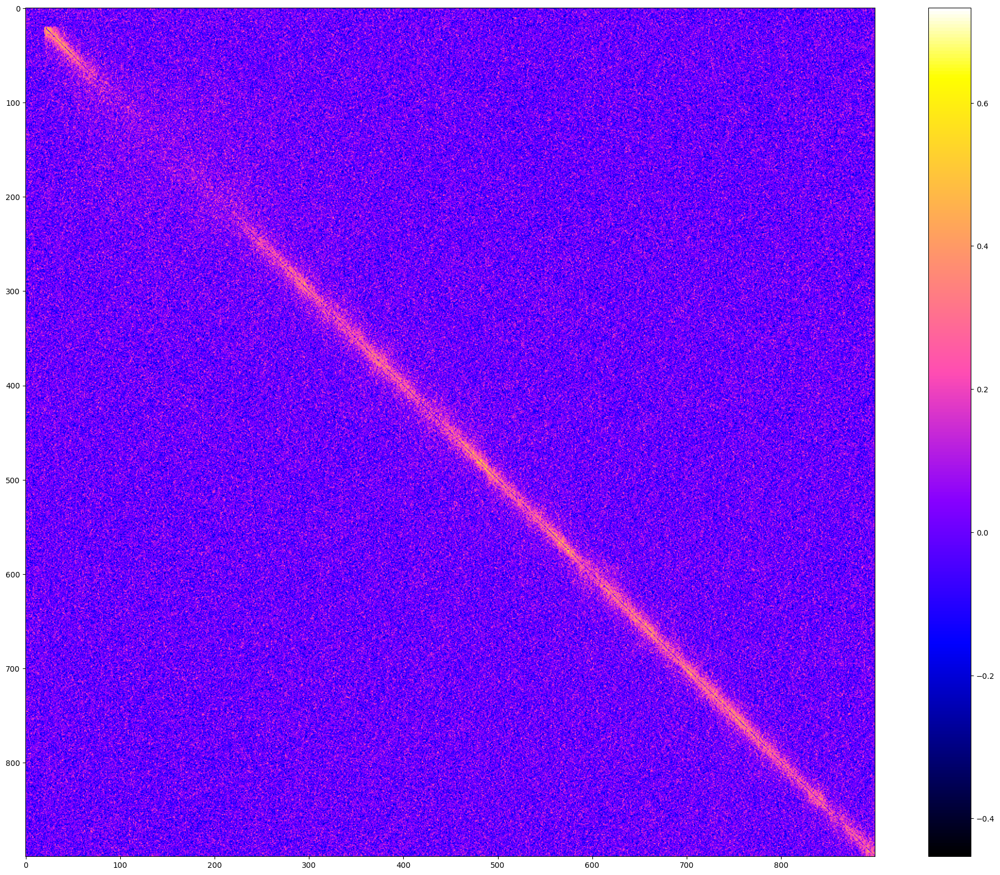

In [4]:
figure(figsize=(25, 20))
plt.imshow(J[600:1500,600:1500],cmap="gnuplot2")
plt.colorbar()
plt.show()

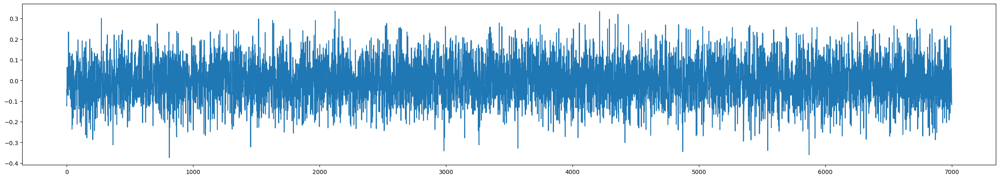

In [5]:
figure(figsize=(30, 5))
plt.plot(h)

In [6]:
# Numba-optimized functions
@njit
def compute_energy(J, h, spins):
    """
    Calculate the energy of a given spin configuration.
    Args:
        J (np.ndarray): Interaction matrix.
        h (np.ndarray): Magnetic field vector.
        spins (np.ndarray): Spin configuration (+1 or -1 for each spin).
    Returns:
        float: The energy of the configuration.
    """
    # Cast spins to float64 to ensure compatibility with J (float64 matrix)
    spins_float = spins.astype(np.float64)
    
    # Energy from interactions between spins
    interaction_energy = -0.5 * np.sum(J * np.outer(spins_float, spins_float))
    
    # Energy from interaction with the magnetic field
    magnetic_energy = -np.sum(h * spins_float)
    
    return interaction_energy + magnetic_energy

@njit
def metropolis_step(J, h, spins, T):
    """
    Perform a single Metropolis-Hastings step.
    Args:
        J (np.ndarray): Interaction matrix.
        h (np.ndarray): Magnetic field vector.
        spins (np.ndarray): Current spin configuration.
        T (float): Temperature.
    Returns:
        np.ndarray: Updated spin configuration.
    """
    N = len(spins)
    
    # Pick a random spin to flip
    i = np.random.randint(N)

    # Cast spins to float64 to ensure compatibility with J (float64 matrix)
    spins_float = spins.astype(np.float64)

    # Calculate the energy difference if the spin is flipped
    delta_E = 2 * spins[i] * (np.dot(J[i], spins_float) + h[i])

    # Flip the spin with probability exp(-ΔE/T) if ΔE > 0
    if delta_E < 0 or np.random.rand() < np.exp(-delta_E / T):
        spins[i] *= -1  # Flip the spin

    return spins

@njit
def run_simulation(J, h, spins, T, steps, MC_step=int(5e2)):
    """
    Simulate the Ising model using the Metropolis-Hastings algorithm.
    Args:
        J (np.ndarray): Interaction matrix.
        h (np.ndarray): Magnetic field vector.
        spins (np.ndarray): Spin configuration.
        T (float): Temperature.
        steps (int): Number of simulation steps.
    Returns:
        np.ndarray: Final spin configuration.
    """
    # Run the simulation
    mags = np.zeros(len(h))
    spin_traj = np.zeros((len(h),steps//MC_step))
    for i in range(steps):
        spins = metropolis_step(J, h, spins, T)
        
        if i%MC_step==0: 
            mags += spins
            spin_traj[:,i//MC_step] = spins
    
    return spin_traj,mags*MC_step/steps
    
# Ising model class
class IsingModel:
    def __init__(self, J, h):
        """
        Initialize the Ising model.
        Args:
            J (np.ndarray): The interaction matrix (NxN for N spins).
            h (np.ndarray): The magnetic field vector (N elements).
        """
        self.J = J  # NxN interaction matrix
        self.h = h  # Magnetic field vector
        self.N = len(h)  # Number of spins

    def energy(self, spins):
        """
        Calculate the energy of a given spin configuration.
        Args:
            spins (np.ndarray): Spin configuration (+1 or -1 for each spin).
        Returns:
            float: The energy of the configuration.
        """
        return compute_energy(self.J, self.h, spins)

    def metropolis_step(self, spins, T):
        """
        Perform a single Metropolis-Hastings step.
        Args:
            spins (np.ndarray): Current spin configuration.
            T (float): Temperature.
        Returns:
            np.ndarray: Updated spin configuration.
        """
        return metropolis_step(self.J, self.h, spins, T)

    def simulate(self, T, steps):
        """
        Simulate the Ising model using the Metropolis-Hastings algorithm.
        Args:
            T (float): Temperature.
            steps (int): Number of simulation steps.
        Returns:
            np.ndarray: Final spin configuration.
        """
        # Start with a random spin configuration (+1 or -1 for each spin)
        spins = np.random.choice([-1, 1], size=self.N)
        
        # Run the simulation
        return run_simulation(self.J, self.h, spins, T, steps)

In [7]:
model = IsingModel(J, h)
spins, B = model.simulate(T=1.0, steps=int(1e6))

print("Final spin configuration:", spins)

/tmp/ipykernel_23564/4126958701.py:70: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(float64, 1, 'A', False, aligned=True), Array(float64, 1, 'C', False, aligned=True))
  spins = metropolis_step(J, h, spins, T)


Final spin configuration: [[ 1.  1.  1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 [-1. -1. -1. ... -1. -1. -1.]
 ...
 [ 1.  1.  1. ... -1. -1. -1.]
 [-1. -1. -1. ...  1.  1.  1.]
 [ 1.  1.  1. ... -1. -1. -1.]]


In [8]:
spins.shape

(7000, 2000)

In [9]:
plt.style.use('seaborn-v0_8-deep')

In [10]:
# Parameters
region, chrom =  [0, 146259331], 'chr8'
N_beads,rep_duration = 7000,5000

# Paths
rept_path = '/home/skorsak/Data/Replication/sc_timing/GM12878_single_cell_data_hg37.mat'

# Run simulation
rep = Replikator(rept_path,N_beads,rep_duration,chrom,region)
rep.process_matrix()
rep.compute_f()

Text(0, 0.5, 'Average Ising State')

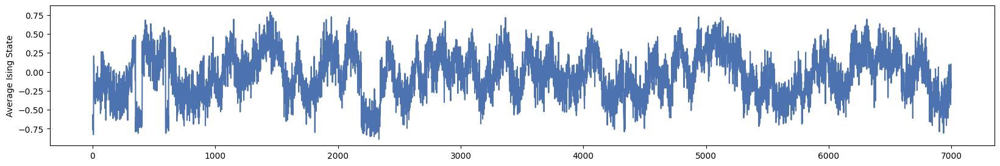

In [11]:
figure(figsize=(20, 3))
plt.plot(B)
plt.ylabel('Average Ising State')

Text(0, 0.5, 'Replication Timing')

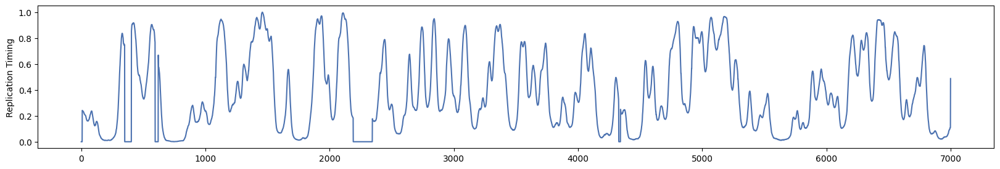

In [12]:
figure(figsize=(20, 3))
plt.plot(rep.avg_fx)
plt.ylabel('Replication Timing')

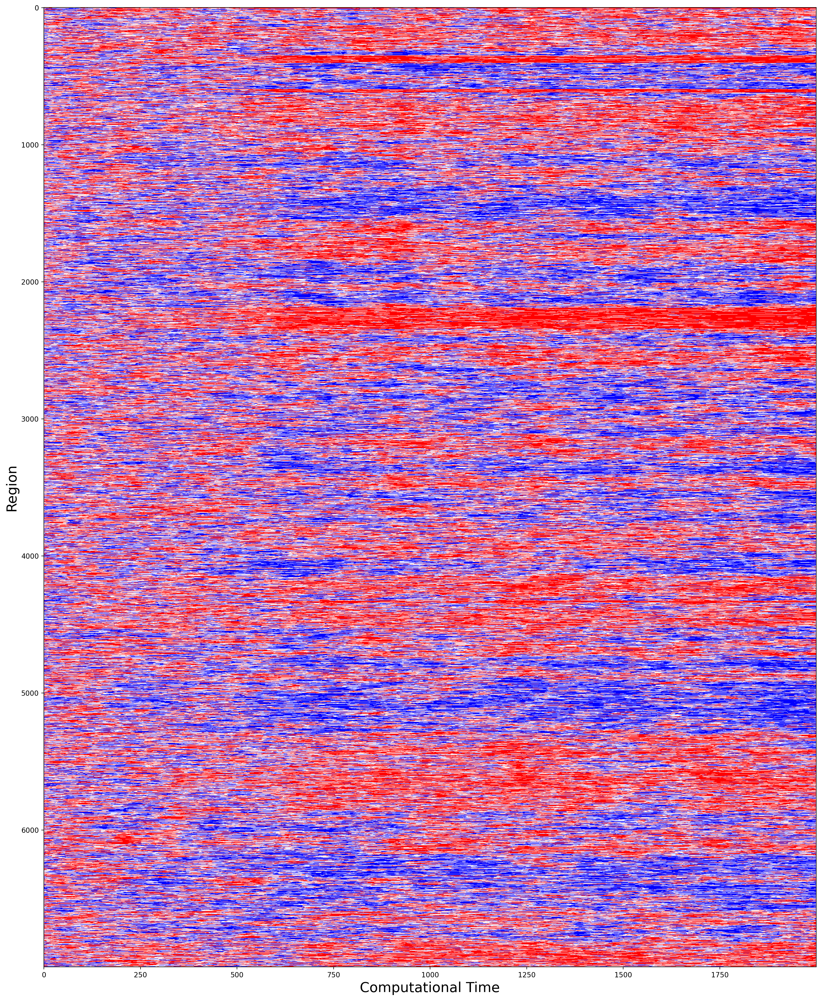

In [13]:
figure(figsize=(20, 25),dpi=200)
plt.imshow(spins,cmap='bwr_r',aspect='auto')
plt.xlabel('Computational Time',fontsize=20)
plt.ylabel('Region', fontsize=20)
plt.show()